### Import and Helpers

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set_style("whitegrid")

import random
import os
import cv2
from tqdm import tqdm

import tensorflow as tf
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Input
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization
from keras.models import Model
from keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions

from PIL import Image
from PIL import ImageFilter

#### Download and Unzip

In [3]:
#!pip install kaggle

In [4]:
#!mkdir ~/.kaggle

In [5]:
#!cp drive/MyDrive/Colab\ Datasets/ML\ Final/kaggle.json ~/.kaggle/

In [6]:
#!chmod 600 ~/.kaggle/kaggle.json

In [7]:
#!kaggle competitions download yelp-restaurant-photo-classification -f train_photos.tgz

In [8]:
# Remove zip file to free up memory
#import os
#os.remove("./train_photos.tgz.zip")
#os.remove("./train_photos.tgz")

In [9]:
#!ls drive/MyDrive/Colab\ Datasets/ML\ Final

In [10]:
# %%time
# !tar -xvf drive/MyDrive/Colab\ Datasets/ML\ Final/train_photos.tgz

#### Helper Functions

In [2]:
# Helper function to do one hot encoding for labels
def encode_label(labels):
    target = np.zeros(9, dtype='int')
    for l in labels:
        target[l] = 1
    return target

In [3]:
# Helper function transfer path to tensorflow images
def path_to_tensor(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    x = image.img_to_array(img)
    return np.expand_dims(x, axis=0)

def paths_to_tensor(img_paths):
    tensors = [path_to_tensor(img_path) for img_path in tqdm(img_paths)]
    return np.vstack(tensors)

In [4]:
# Helper function to print loss function and accuracy history
def history(model):
    plt.figure(figsize = (15, 5) )

    plt.subplot(121)
    plt.plot(model.history['loss'], color='blue', label='train')
    plt.plot(model.history['val_loss'], color='red', label='valid')
    plt.legend()
    plt.xlabel('Epoch')
    plt.ylabel('Loss Function')

    plt.subplot(122)
    plt.plot(model.history['binary_accuracy'], color = 'blue', label='train')
    plt.plot(model.history['val_binary_accuracy'], color='red', label='valid')
    plt.legend()
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')

In [5]:
# Helper function to calculate results
def true_pos(y_true, y_pred):
    return np.sum(y_true * y_pred)


def false_pos(y_true, y_pred):
    return np.sum(y_true * (1. - y_pred))


def false_neg(y_true, y_pred):
    return np.sum((1. - y_true) * y_pred)


def precision(y_true, y_pred):
    return true_pos(y_true, y_pred) / (true_pos(y_true, y_pred) + false_pos(y_true, y_pred))


def recall(y_true, y_pred):
    return true_pos(y_true, y_pred) / (true_pos(y_true, y_pred) + false_neg(y_true, y_pred))


def f1_score(y_true, y_pred):
    return 2. / (1. / recall(y_true, y_pred) + 1. / precision(y_true, y_pred))

### EDA

#### Data Load

In [74]:
# Business id to labels
df = pd.read_csv('Data/train.csv', header = 0, names = ['business','labels']).fillna('')

# Photo id to business id for the training dataset
photo2biz_train = pd.read_csv('Data/train_photo_to_biz_ids.csv', header = 0, names = ['photo','business'])

# Photo id to business id for the test dataset
photo2biz_test = pd.read_csv('Data/test_photo_to_biz.csv', header = 0, names = ['photo','business'])

In [7]:
df.head()

,business,labels
0,1000,1 2 3 4 5 6 7
1,1001,0 1 6 8
2,100,1 2 4 5 6 7
3,1006,1 2 4 5 6
4,1010,0 6 8


In [80]:
df[df.business==2776]

,business,labels
1225,3216,1 5 6 7


In [81]:
photo2biz_train.head()

,photo,business
0,204149,3034
1,52779,2805
2,278973,485
3,195284,485
4,19992,485


In [76]:
photo2biz_train[photo2biz_train.photo==74217]

,photo,business
197307,74217,465


In [9]:
# Map business to labels
df['labels'] = df['labels'].apply(lambda x: tuple(sorted(int(t) for t in x.split())))
df.set_index('business', inplace=True)

df.head(n=10)

,labels
business,
1000,"(1, 2, 3, 4, 5, 6, 7)"
1001,"(0, 1, 6, 8)"
100,"(1, 2, 4, 5, 6, 7)"
1006,"(1, 2, 4, 5, 6)"
1010,"(0, 6, 8)"
101,"(1, 2, 3, 4, 5, 6)"
1011,"(2, 3, 5, 6)"
1012,"(1, 2, 3, 5, 6)"
1014,"(1, 2, 4, 5, 6)"


In [10]:
# Append photos list to each business
biz2photos_train = photo2biz_train.groupby('business')['photo'].apply(list)
df['photos'] = biz2photos_train
df['n_photos'] = biz2photos_train.apply(len)

df.head(n=10)

,labels,photos,n_photos
business,,,
1000,"(1, 2, 3, 4, 5, 6, 7)","[438623, 325966, 227692, 407856, 368729, 16319...",54
1001,"(0, 1, 6, 8)","[298536, 20346, 8457, 308694, 349310, 407838, ...",9
100,"(1, 2, 4, 5, 6, 7)","[338465, 328433, 243861, 361777, 127198, 46652...",84
1006,"(1, 2, 4, 5, 6)","[46472, 341947, 396253, 75316, 42330, 244095, ...",22
1010,"(0, 6, 8)","[118251, 219940, 27517, 8578, 148347, 433559, ...",11
101,"(1, 2, 3, 4, 5, 6)","[13736, 393696, 286907, 86169, 243460, 254663,...",121
1011,"(2, 3, 5, 6)","[372371, 116870, 411981, 208597, 127752, 18839...",70
1012,"(1, 2, 3, 5, 6)","[287385, 232258, 388225, 151345, 417121, 32754...",37
1014,"(1, 2, 4, 5, 6)","[407910, 33911, 269241, 374218, 256236, 296370...",32


In [11]:
# Train data info
print('There are %d businesses in the training dataset' % len(df))
print('There are %d photos in the training dataset' % df['n_photos'].sum())
print('There are %d photos per business on average' % df['n_photos'].mean())

There are 2000 businesses in the training dataset
There are 234842 photos in the training dataset
There are 117 photos per business on average


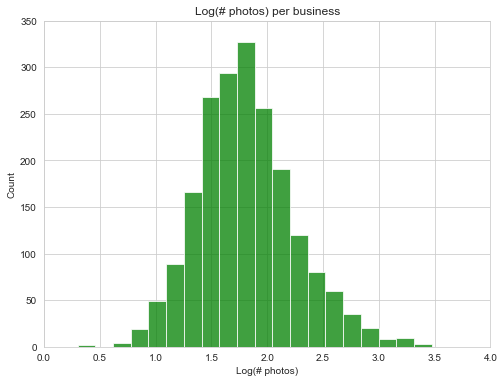

In [12]:
# Number of photos per business distribution in Train data
import math

n_photos = [math.log10(x) for x in df['n_photos'].tolist()]

plt.figure(figsize = (8,6))
n, bins, patches = plt.hist(n_photos, 20, facecolor='g', alpha=0.75)

plt.xlabel('Log(# photos)')
plt.ylabel('Count')
plt.title('Log(# photos) per business')
plt.axis([0, 4, 0, 350])
plt.grid(True)
plt.show()

In [13]:
# Create label dictionary and transfer labels to strings
from collections import OrderedDict

labels = OrderedDict()
labels['0'] = 'good_for_lunch'
labels['1'] = 'good_for_dinner'
labels['2'] = 'takes_reservations'
labels['3'] = 'outdoor_seating'
labels['4'] = 'restaurant_is_expensive'
labels['5'] = 'has_alcohol'
labels['6'] = 'has_table_service'
labels['7'] = 'ambience_is_classy'
labels['8'] = 'good_for_kids'

train_labels = np.vstack(df['labels'].apply(encode_label))

In [14]:
# Test data info
biz2photos_test = photo2biz_test.groupby('business')['photo'].apply(list).to_dict()
biz_test = list(biz2photos_test.keys())
print('There are %d businesses in the test dataset.' % len(biz_test))

There are 10000 businesses in the test dataset.


#### Visualization

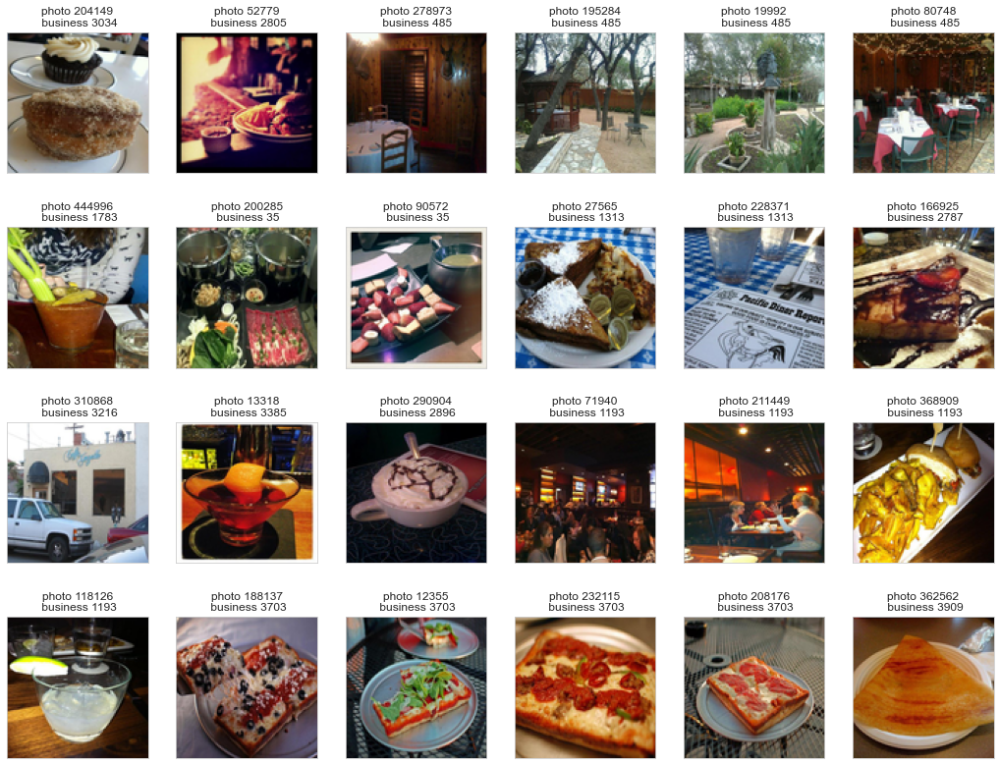

In [15]:
# Display the first 24 images in the training dataset
fig = plt.figure(figsize = (18,14))
for i in range(24):
    img = Image.open('Data/train_photos/' + str(photo2biz_train.loc[i][0]) + '.jpg')
    img = img.resize((100, 100), Image.ANTIALIAS)
    ax = fig.add_subplot(4, 6, i+1, xticks = [], yticks = [])
    ax.set_title('photo ' + str(photo2biz_train.loc[i][0]) + '\n business ' + str(photo2biz_train.loc[i][1]))
    ax.imshow(img)

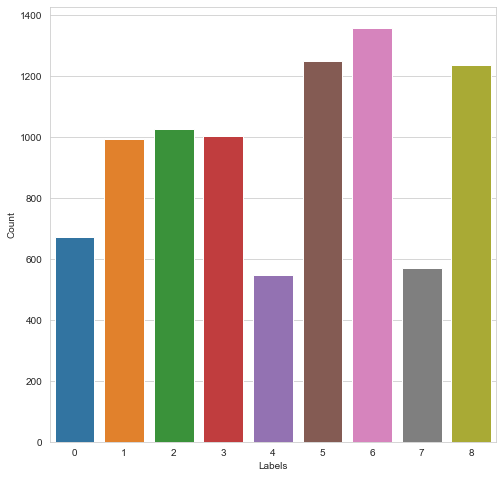

In [16]:
# Display distribution of the number of each label
fig = plt.figure(figsize = (8,8))
ax = sns.barplot(x=list(labels.keys()), y=list(np.sum(train_labels, axis = 0)))
ax.set_xlabel('Labels')
ax.set_ylabel('Count')
plt.show()

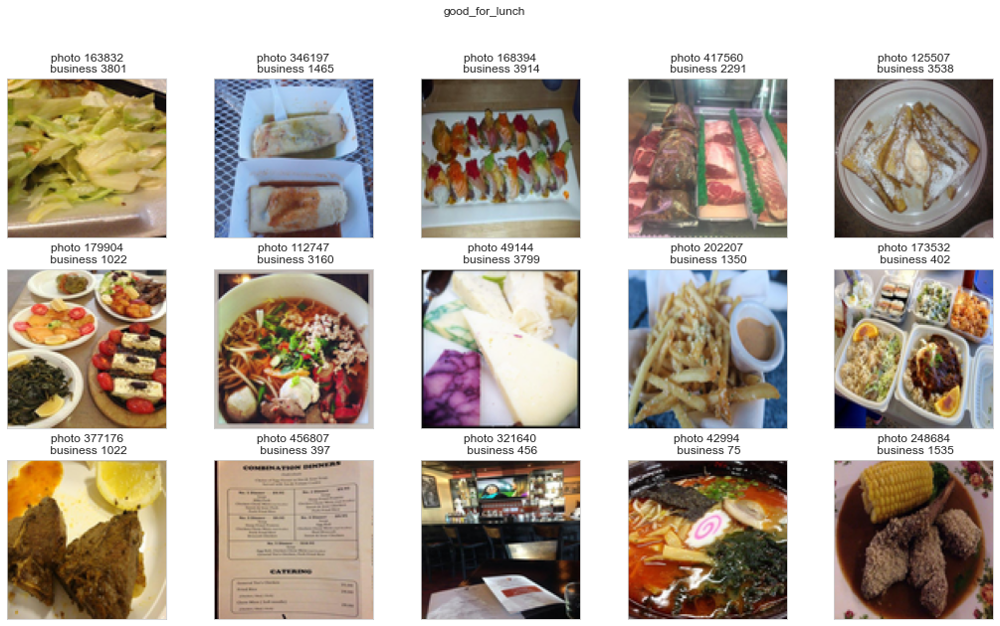

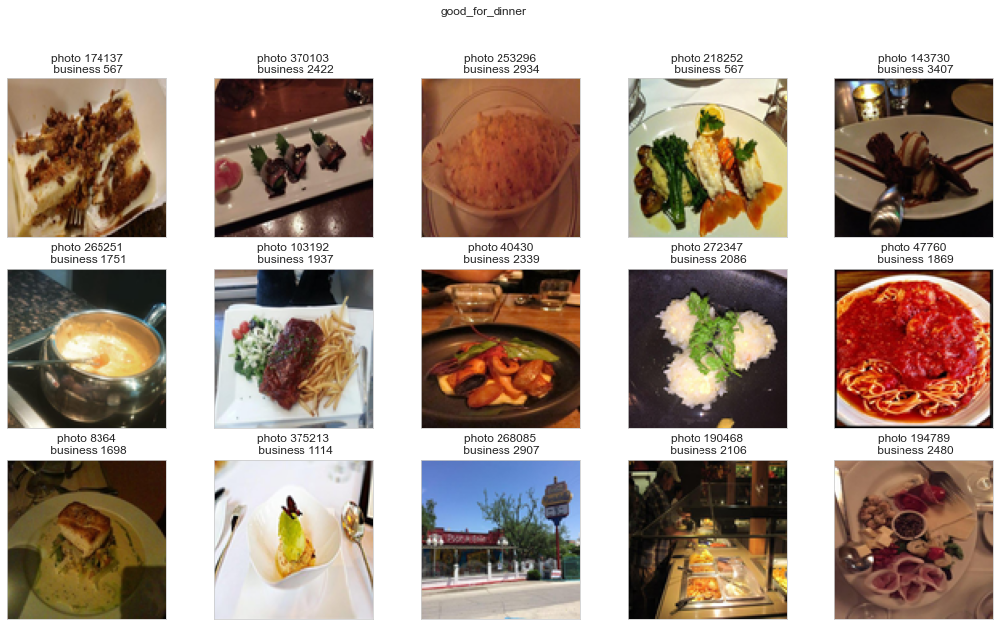

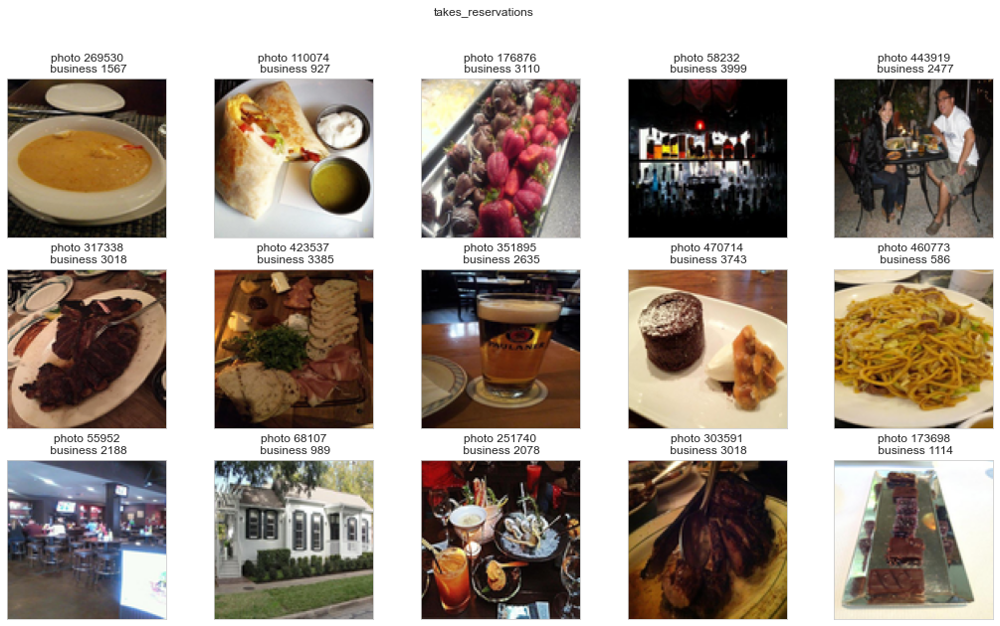

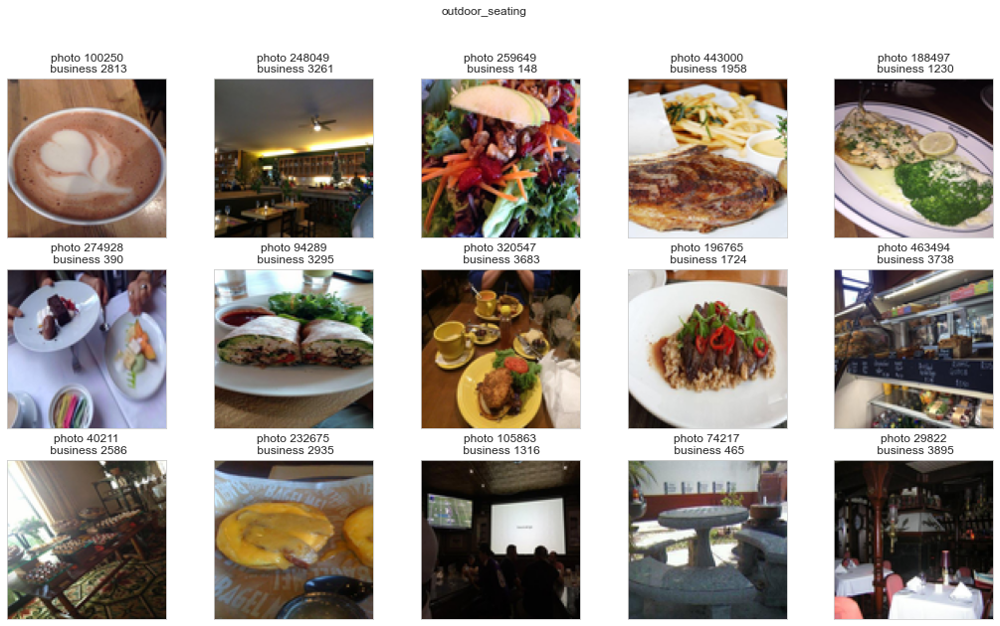

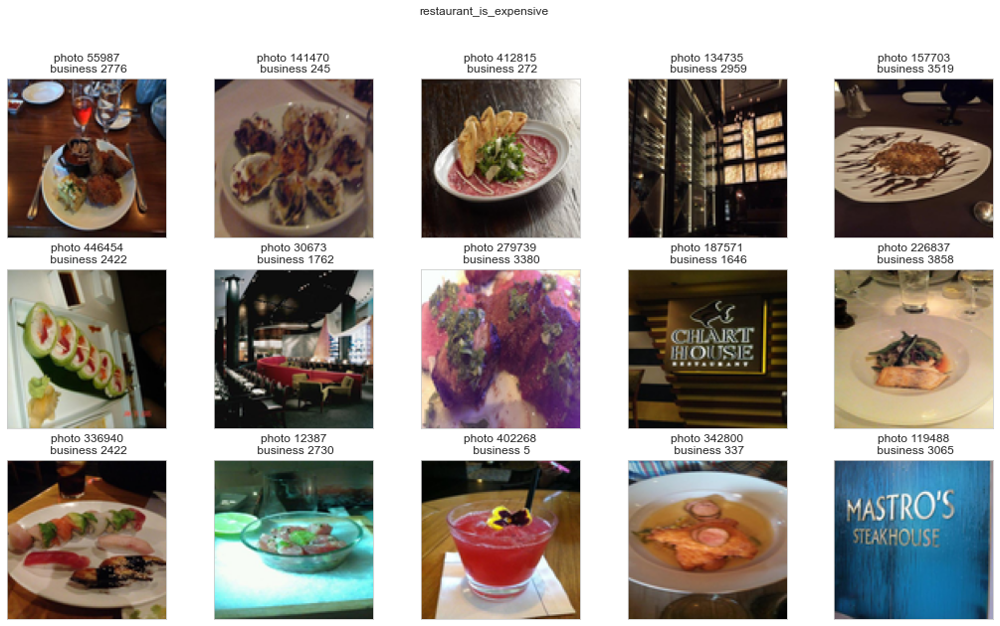

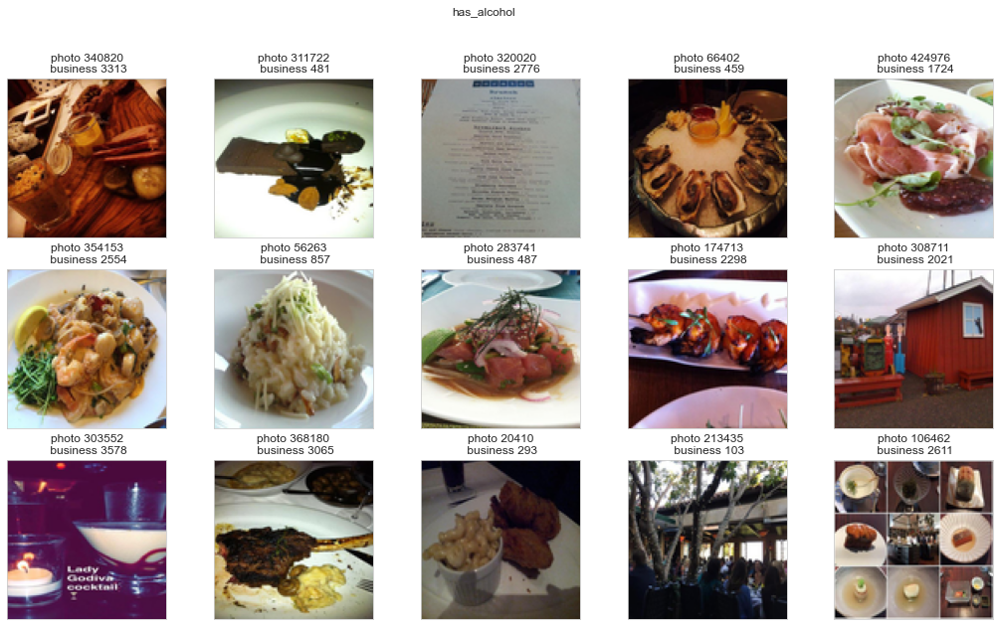

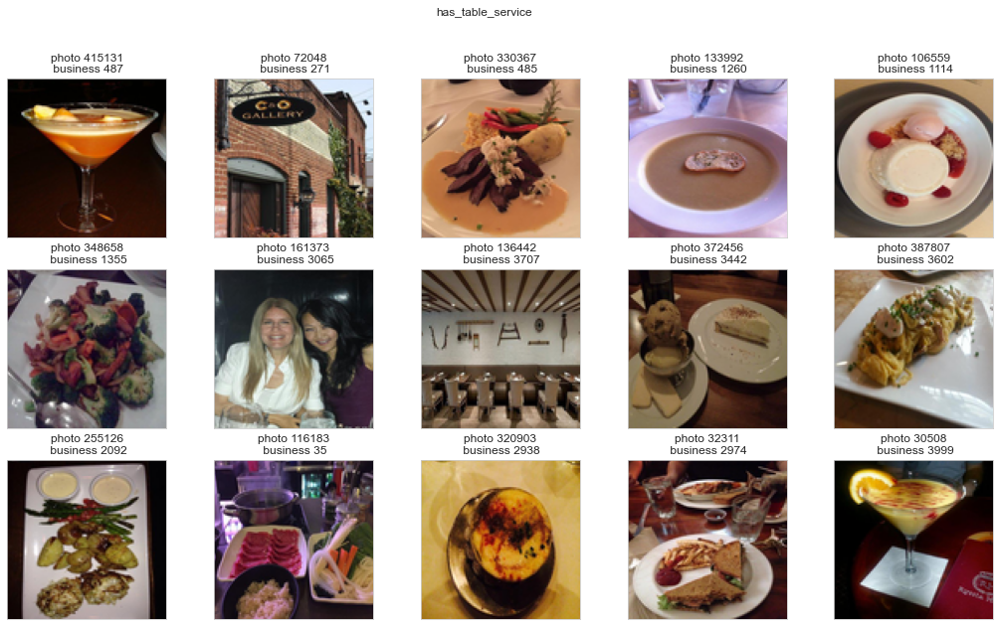

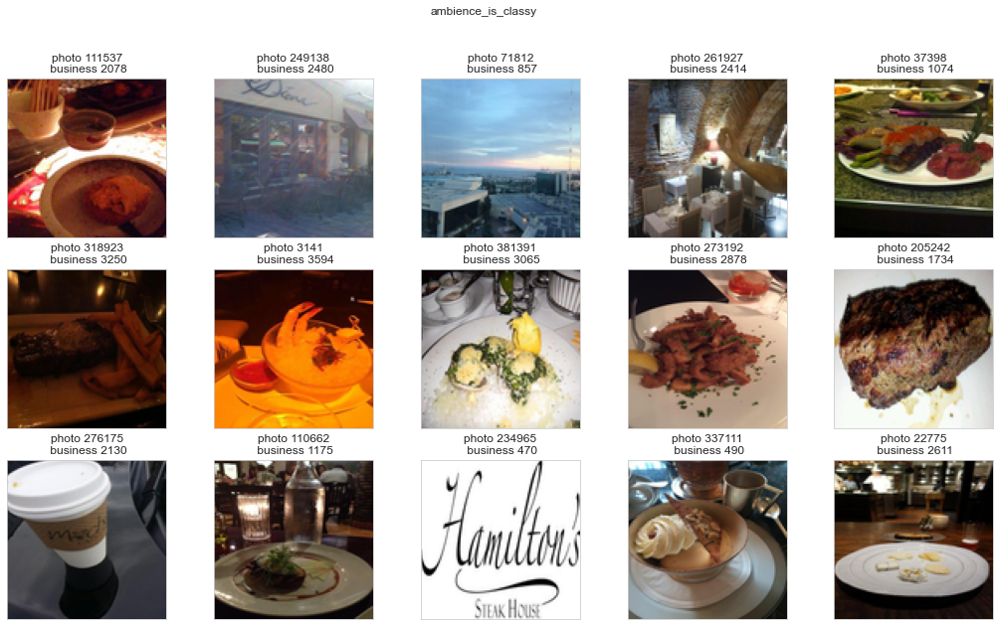

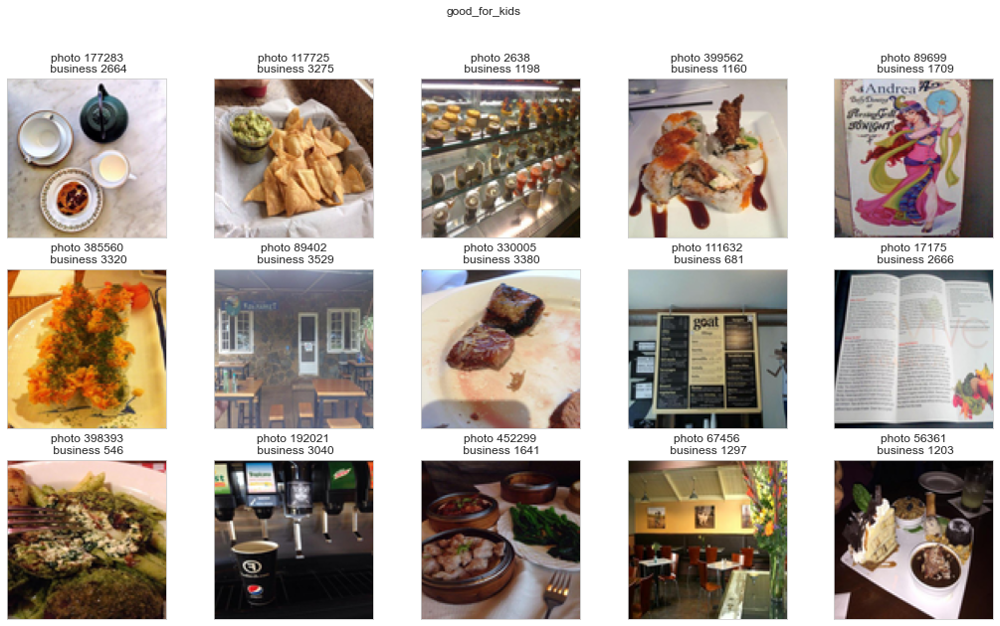

In [17]:
# Display sample images for each label
nImage = 15

for l, v in labels.items():
    photo_ids = np.random.choice(np.hstack(df[df['labels'].apply(lambda x: l in map(str,x))]['photos']), nImage)
    fig = plt.figure(figsize = (18,10))
    fig.suptitle(v)
    biz_ids = [list(photo2biz_train.loc[photo2biz_train['photo'] == i, 'business'])[0] for i in photo_ids]
    for i in range(len(photo_ids)):
        img = Image.open('Data/train_photos/' + str(photo_ids[i]) + '.jpg')
        img = img.resize((100, 100), Image.ANTIALIAS)
        ax = fig.add_subplot(3, 5, i+1, xticks = [], yticks = [])
        ax.set_title('photo ' + str(photo_ids[i]) + '\n business ' + str(biz_ids[i]))
        ax.imshow(img)

### Preprocess

In [53]:
# Business id to labels
biz2labels = pd.read_csv('Data/train.csv', header = 0, names = ['business','labels']).fillna('')

# Photo id to business id for the training dataset
photo2biz_train = pd.read_csv('Data/train_photo_to_biz_ids.csv', header = 0, names = ['photo','business'])

# Get list of photo id 
photo_ids = np.array(photo2biz_train['photo'])

print('There are %d training images' % len(photo_ids))

There are 234842 training images


In [54]:
biz2labels['labels'] = biz2labels['labels'].apply(lambda x: tuple(sorted(int(t) for t in x.split())))
biz2labels.set_index('business', inplace=True)
biz2labels.head(n=10)

,labels
business,
1000,"(1, 2, 3, 4, 5, 6, 7)"
1001,"(0, 1, 6, 8)"
100,"(1, 2, 4, 5, 6, 7)"
1006,"(1, 2, 4, 5, 6)"
1010,"(0, 6, 8)"
101,"(1, 2, 3, 4, 5, 6)"
1011,"(2, 3, 5, 6)"
1012,"(1, 2, 3, 5, 6)"
1014,"(1, 2, 4, 5, 6)"


In [55]:
# biz2labels['new_label'] = [[0]]*len(biz2labels)
# for i in biz2labels.index:
#     biz2labels.at[i, 'new_label'] = tuple(i for i in biz2labels.loc[i]['labels'] if i in [0,1,4,5,8])
# biz2labels.head(n=10)

In [56]:
photo2biz_train.head()

,photo,business
0,204149,3034
1,52779,2805
2,278973,485
3,195284,485
4,19992,485


In [57]:
photo2biz_train[photo2biz_train.photo==419974]

,photo,business
175013,419974,396


In [58]:
photo_targets = np.vstack(biz2labels.loc[photo2biz_train['business']]['labels'].apply(encode_label))
print('Number of rows: %d - Number of columns: %d' % (photo_targets.shape[0], photo_targets.shape[1]))

Number of rows: 234842 - Number of columns: 9


In [59]:
from sklearn.model_selection import train_test_split

train_files, test_files, train_targets, test_targets = train_test_split(photo_ids,
                                                                        photo_targets,
                                                                        test_size=0.25,
                                                                        random_state=7)

valid_files, valid_targets = (test_files[:int(len(test_files)/2)], test_targets[:int(len(test_files)/2)])
test_files, test_targets = (test_files[int(len(test_files)/2):], test_targets[int(len(test_files)/2):])

print('There are %d images in the training dataset' % len(train_files))
print('There are %d images in the validation dataset' % len(valid_files))
print('There are %d images in the test dataset' % len(test_files))

There are 176131 images in the training dataset
There are 29355 images in the validation dataset
There are 29356 images in the test dataset


### Bottleneck Features Extraction

In [60]:
# Load Pictures
train_files = np.array(['Data/train_photos/' + str(i) + '.jpg' for i in train_files])
valid_files = np.array(['Data/train_photos/' + str(i) + '.jpg' for i in valid_files])
test_files = np.array(['Data/train_photos/' + str(i) + '.jpg' for i in test_files])

print('There are %d images in the training dataset' % len(train_files))
print('There are %d images in the validation dataset' % len(valid_files))
print('There are %d images in the test dataset' % len(test_files))

There are 176131 images in the training dataset
There are 29355 images in the validation dataset
There are 29356 images in the test dataset


In [26]:
# Number of pictures to process for each dataset
nb_train, nb_valid, nb_test = (20000,2000,2000)

#### ResNet50

In [27]:
# Preprocess pictures to tensors
train_tensors = preprocess_input(paths_to_tensor(train_files[:nb_train]))
valid_tensors = preprocess_input(paths_to_tensor(valid_files[:nb_valid]))
test_tensors = preprocess_input(paths_to_tensor(test_files[:nb_test]))

100%|██████████████████████████████████████| 2000/2000 [00:06<00:00, 325.66it/s]


In [28]:
# Show reults
print(train_tensors.shape)
print(valid_tensors.shape)
print(test_tensors.shape)

(20000, 224, 224, 3)
(2000, 224, 224, 3)
(2000, 224, 224, 3)


In [29]:
# Import the ResNet50 Model, with the Final Fully-Connected Layers Removed
# So that we can receive the bottleneck features.
model = ResNet50(include_top=False)
model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, None, None,   0           ['input_1[0][0]']                
                                3)                                                                
                                                                                                  
 conv1_conv (Conv2D)            (None, None, None,   9472        ['conv1_pad[0][0]']              
                                64)                                                        

                                                                                                  
 conv2_block2_add (Add)         (None, None, None,   0           ['conv2_block1_out[0][0]',       
                                256)                              'conv2_block2_3_bn[0][0]']      
                                                                                                  
 conv2_block2_out (Activation)  (None, None, None,   0           ['conv2_block2_add[0][0]']       
                                256)                                                              
                                                                                                  
 conv2_block3_1_conv (Conv2D)   (None, None, None,   16448       ['conv2_block2_out[0][0]']       
                                64)                                                               
                                                                                                  
 conv2_blo

                                128)                                                              
                                                                                                  
 conv3_block2_2_bn (BatchNormal  (None, None, None,   512        ['conv3_block2_2_conv[0][0]']    
 ization)                       128)                                                              
                                                                                                  
 conv3_block2_2_relu (Activatio  (None, None, None,   0          ['conv3_block2_2_bn[0][0]']      
 n)                             128)                                                              
                                                                                                  
 conv3_block2_3_conv (Conv2D)   (None, None, None,   66048       ['conv3_block2_2_relu[0][0]']    
                                512)                                                              
          

 conv4_block1_1_bn (BatchNormal  (None, None, None,   1024       ['conv4_block1_1_conv[0][0]']    
 ization)                       256)                                                              
                                                                                                  
 conv4_block1_1_relu (Activatio  (None, None, None,   0          ['conv4_block1_1_bn[0][0]']      
 n)                             256)                                                              
                                                                                                  
 conv4_block1_2_conv (Conv2D)   (None, None, None,   590080      ['conv4_block1_1_relu[0][0]']    
                                256)                                                              
                                                                                                  
 conv4_block1_2_bn (BatchNormal  (None, None, None,   1024       ['conv4_block1_2_conv[0][0]']    
 ization) 

                                                                                                  
 conv4_block3_3_bn (BatchNormal  (None, None, None,   4096       ['conv4_block3_3_conv[0][0]']    
 ization)                       1024)                                                             
                                                                                                  
 conv4_block3_add (Add)         (None, None, None,   0           ['conv4_block2_out[0][0]',       
                                1024)                             'conv4_block3_3_bn[0][0]']      
                                                                                                  
 conv4_block3_out (Activation)  (None, None, None,   0           ['conv4_block3_add[0][0]']       
                                1024)                                                             
                                                                                                  
 conv4_blo

 ization)                       256)                                                              
                                                                                                  
 conv4_block6_2_relu (Activatio  (None, None, None,   0          ['conv4_block6_2_bn[0][0]']      
 n)                             256)                                                              
                                                                                                  
 conv4_block6_3_conv (Conv2D)   (None, None, None,   263168      ['conv4_block6_2_relu[0][0]']    
                                1024)                                                             
                                                                                                  
 conv4_block6_3_bn (BatchNormal  (None, None, None,   4096       ['conv4_block6_3_conv[0][0]']    
 ization)                       1024)                                                             
          

 conv5_block3_1_conv (Conv2D)   (None, None, None,   1049088     ['conv5_block2_out[0][0]']       
                                512)                                                              
                                                                                                  
 conv5_block3_1_bn (BatchNormal  (None, None, None,   2048       ['conv5_block3_1_conv[0][0]']    
 ization)                       512)                                                              
                                                                                                  
 conv5_block3_1_relu (Activatio  (None, None, None,   0          ['conv5_block3_1_bn[0][0]']      
 n)                             512)                                                              
                                                                                                  
 conv5_block3_2_conv (Conv2D)   (None, None, None,   2359808     ['conv5_block3_1_relu[0][0]']    
          

In [30]:
# Extract Output of Final Max Pooling Layer for the bottleneck features.
train_resnet50 = model.predict(train_tensors)
valid_resnet50 = model.predict(valid_tensors)
test_resnet50  = model.predict(test_tensors)

2022-05-31 11:42:38.420457: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


In [31]:
# Show reults
print(train_resnet50.shape)
print(valid_resnet50.shape)
print(test_resnet50.shape)

(20000, 7, 7, 2048)
(2000, 7, 7, 2048)
(2000, 7, 7, 2048)


In [32]:
#!touch drive/MyDrive/Colab\ Datasets/ML\ Final/bottleneck_features/yelp_resnet50.npz

In [33]:
# Save Transformed Data
np.savez('yelp_resnet50.npz', 
         train_features=train_resnet50, train_targets=train_targets[:nb_train],
         valid_features=valid_resnet50, valid_targets=valid_targets[:nb_valid],
         test_features=test_resnet50, test_targets=test_targets[:nb_test])

### Classification

#### ResNet50

##### Transformed Data

In [21]:
# Load Transformed Data
bottleneck_features = np.load('yelp_resnet50.npz')
train_resnet50 = bottleneck_features['train_features']
valid_resnet50 = bottleneck_features['valid_features']
test_resnet50 = bottleneck_features['test_features']

train_targets = bottleneck_features['train_targets']
valid_targets = bottleneck_features['valid_targets']
test_targets = bottleneck_features['test_targets']

##### Fit

In [22]:
# Create Model
from keras.models import Sequential
from keras.layers import GlobalAveragePooling2D, MaxPooling2D 
from keras.layers import Conv2D, Dense, Dropout, Activation, Flatten, BatchNormalization
from keras.regularizers import l2

resnet50 = Sequential()
resnet50.add(GlobalAveragePooling2D(input_shape=train_resnet50.shape[1:]))

resnet50.add(Dense(1024, activation='relu', kernel_regularizer=l2(1e-4)))
resnet50.add(BatchNormalization())
resnet50.add(Dropout(0.3))

resnet50.add(Dense(512, activation='relu', kernel_regularizer=l2(1e-4)))
resnet50.add(BatchNormalization())
resnet50.add(Dropout(0.3))

resnet50.add(Dense(256, activation='relu', kernel_regularizer=l2(1e-4)))
resnet50.add(BatchNormalization())

resnet50.add(Dense(9, activation='sigmoid'))

resnet50.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 1024)              2098176   
                                                                 
 batch_normalization (BatchN  (None, 1024)             4096      
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 batch_normalization_1 (Batc  (None, 512)              2

In [23]:
# Compile Model
from tensorflow.keras.optimizers import SGD

sgd = SGD(lr=0.0001, decay=1e-6, momentum=0.9, nesterov=True)
resnet50.compile(loss='binary_crossentropy', optimizer=sgd, metrics=['binary_accuracy'])

/Users/WilliamDai/miniforge3/envs/TFmacOS/lib/python3.9/site-packages/keras/optimizer_v2/gradient_descent.py:102: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(SGD, self).__init__(name, **kwargs)


In [24]:
# Fit Model with save
from keras.callbacks import ModelCheckpoint, EarlyStopping

checkpointer = ModelCheckpoint(filepath='weights_compare_resnet50.hdf5', save_best_only=True)
checkimprovement = EarlyStopping(monitor='val_loss', min_delta=0, patience=20)

history_resnet50 = resnet50.fit(train_resnet50, train_targets, 
                                validation_data=(valid_resnet50,valid_targets), 
                                epochs=1000, batch_size=64,
                                callbacks=[checkpointer,checkimprovement]
                               )

Epoch 1/1000


2022-06-01 23:02:10.022930: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


313/313 [==============================] - 4s 11ms/step - loss: 1.1099 - binary_accuracy: 0.5064 - val_loss: 1.0126 - val_binary_accuracy: 0.5032
Epoch 2/1000
313/313 [==============================] - 4s 12ms/step - loss: 1.0682 - binary_accuracy: 0.5297 - val_loss: 0.9900 - val_binary_accuracy: 0.5369
Epoch 3/1000
313/313 [==============================] - 4s 12ms/step - loss: 1.0375 - binary_accuracy: 0.5510 - val_loss: 0.9653 - val_binary_accuracy: 0.5604
Epoch 4/1000
313/313 [==============================] - 4s 13ms/step - loss: 1.0123 - binary_accuracy: 0.5671 - val_loss: 0.9435 - val_binary_accuracy: 0.5826
Epoch 5/1000
313/313 [==============================] - 4s 13ms/step - loss: 0.9934 - binary_accuracy: 0.5786 - val_loss: 0.9270 - val_binary_accuracy: 0.5984
Epoch 6/1000
313/313 [==============================] - 4s 14ms/step - loss: 0.9737 - binary_accuracy: 0.5948 - val_loss: 0.9142 - val_binary_accuracy: 0.6105
Epoch 7/1000
313/313 [==============================] - 4s 

313/313 [==============================] - 4s 12ms/step - loss: 0.7782 - binary_accuracy: 0.7262 - val_loss: 0.7706 - val_binary_accuracy: 0.7302
Epoch 53/1000
313/313 [==============================] - 4s 12ms/step - loss: 0.7748 - binary_accuracy: 0.7299 - val_loss: 0.7689 - val_binary_accuracy: 0.7302
Epoch 54/1000
313/313 [==============================] - 4s 13ms/step - loss: 0.7745 - binary_accuracy: 0.7289 - val_loss: 0.7687 - val_binary_accuracy: 0.7307
Epoch 55/1000
313/313 [==============================] - 4s 13ms/step - loss: 0.7724 - binary_accuracy: 0.7305 - val_loss: 0.7677 - val_binary_accuracy: 0.7314
Epoch 56/1000
313/313 [==============================] - 4s 12ms/step - loss: 0.7706 - binary_accuracy: 0.7320 - val_loss: 0.7667 - val_binary_accuracy: 0.7315
Epoch 57/1000
313/313 [==============================] - 4s 13ms/step - loss: 0.7710 - binary_accuracy: 0.7311 - val_loss: 0.7657 - val_binary_accuracy: 0.7326
Epoch 58/1000
313/313 [==============================]

313/313 [==============================] - 4s 13ms/step - loss: 0.7244 - binary_accuracy: 0.7582 - val_loss: 0.7415 - val_binary_accuracy: 0.7452
Epoch 104/1000
313/313 [==============================] - 4s 13ms/step - loss: 0.7253 - binary_accuracy: 0.7574 - val_loss: 0.7410 - val_binary_accuracy: 0.7456
Epoch 105/1000
313/313 [==============================] - 4s 13ms/step - loss: 0.7233 - binary_accuracy: 0.7581 - val_loss: 0.7407 - val_binary_accuracy: 0.7455
Epoch 106/1000
313/313 [==============================] - 4s 13ms/step - loss: 0.7232 - binary_accuracy: 0.7589 - val_loss: 0.7407 - val_binary_accuracy: 0.7448
Epoch 107/1000
313/313 [==============================] - 4s 13ms/step - loss: 0.7215 - binary_accuracy: 0.7593 - val_loss: 0.7401 - val_binary_accuracy: 0.7462
Epoch 108/1000
313/313 [==============================] - 4s 13ms/step - loss: 0.7207 - binary_accuracy: 0.7601 - val_loss: 0.7398 - val_binary_accuracy: 0.7468
Epoch 109/1000
313/313 [=========================

Epoch 154/1000
313/313 [==============================] - 4s 13ms/step - loss: 0.6959 - binary_accuracy: 0.7740 - val_loss: 0.7303 - val_binary_accuracy: 0.7517
Epoch 155/1000
313/313 [==============================] - 4s 13ms/step - loss: 0.6951 - binary_accuracy: 0.7739 - val_loss: 0.7302 - val_binary_accuracy: 0.7520
Epoch 156/1000
313/313 [==============================] - 4s 13ms/step - loss: 0.6937 - binary_accuracy: 0.7747 - val_loss: 0.7298 - val_binary_accuracy: 0.7524
Epoch 157/1000
313/313 [==============================] - 4s 13ms/step - loss: 0.6968 - binary_accuracy: 0.7731 - val_loss: 0.7296 - val_binary_accuracy: 0.7523
Epoch 158/1000
313/313 [==============================] - 4s 13ms/step - loss: 0.6940 - binary_accuracy: 0.7745 - val_loss: 0.7298 - val_binary_accuracy: 0.7523
Epoch 159/1000
313/313 [==============================] - 4s 13ms/step - loss: 0.6929 - binary_accuracy: 0.7754 - val_loss: 0.7293 - val_binary_accuracy: 0.7529
Epoch 160/1000
313/313 [==========

Epoch 205/1000
313/313 [==============================] - 4s 12ms/step - loss: 0.6714 - binary_accuracy: 0.7867 - val_loss: 0.7248 - val_binary_accuracy: 0.7564
Epoch 206/1000
313/313 [==============================] - 4s 13ms/step - loss: 0.6720 - binary_accuracy: 0.7860 - val_loss: 0.7247 - val_binary_accuracy: 0.7558
Epoch 207/1000
313/313 [==============================] - 4s 14ms/step - loss: 0.6708 - binary_accuracy: 0.7879 - val_loss: 0.7246 - val_binary_accuracy: 0.7564
Epoch 208/1000
313/313 [==============================] - 4s 13ms/step - loss: 0.6727 - binary_accuracy: 0.7855 - val_loss: 0.7247 - val_binary_accuracy: 0.7561
Epoch 209/1000
313/313 [==============================] - 4s 14ms/step - loss: 0.6713 - binary_accuracy: 0.7861 - val_loss: 0.7246 - val_binary_accuracy: 0.7560
Epoch 210/1000
313/313 [==============================] - 4s 14ms/step - loss: 0.6703 - binary_accuracy: 0.7883 - val_loss: 0.7243 - val_binary_accuracy: 0.7564
Epoch 211/1000
313/313 [==========

Epoch 256/1000
313/313 [==============================] - 4s 13ms/step - loss: 0.6522 - binary_accuracy: 0.7973 - val_loss: 0.7228 - val_binary_accuracy: 0.7568
Epoch 257/1000
313/313 [==============================] - 4s 13ms/step - loss: 0.6521 - binary_accuracy: 0.7974 - val_loss: 0.7226 - val_binary_accuracy: 0.7573
Epoch 258/1000
313/313 [==============================] - 4s 13ms/step - loss: 0.6524 - binary_accuracy: 0.7982 - val_loss: 0.7226 - val_binary_accuracy: 0.7572
Epoch 259/1000
313/313 [==============================] - 4s 13ms/step - loss: 0.6518 - binary_accuracy: 0.7973 - val_loss: 0.7230 - val_binary_accuracy: 0.7575
Epoch 260/1000
313/313 [==============================] - 4s 13ms/step - loss: 0.6511 - binary_accuracy: 0.7988 - val_loss: 0.7227 - val_binary_accuracy: 0.7569
Epoch 261/1000
313/313 [==============================] - 5s 14ms/step - loss: 0.6504 - binary_accuracy: 0.7988 - val_loss: 0.7225 - val_binary_accuracy: 0.7573
Epoch 262/1000
313/313 [==========

Epoch 307/1000
313/313 [==============================] - 4s 14ms/step - loss: 0.6329 - binary_accuracy: 0.8078 - val_loss: 0.7230 - val_binary_accuracy: 0.7569
Epoch 308/1000
313/313 [==============================] - 4s 14ms/step - loss: 0.6322 - binary_accuracy: 0.8082 - val_loss: 0.7225 - val_binary_accuracy: 0.7575
Epoch 309/1000
313/313 [==============================] - 4s 13ms/step - loss: 0.6341 - binary_accuracy: 0.8073 - val_loss: 0.7227 - val_binary_accuracy: 0.7573
Epoch 310/1000
313/313 [==============================] - 4s 14ms/step - loss: 0.6319 - binary_accuracy: 0.8096 - val_loss: 0.7227 - val_binary_accuracy: 0.7563
Epoch 311/1000
313/313 [==============================] - 4s 14ms/step - loss: 0.6315 - binary_accuracy: 0.8096 - val_loss: 0.7229 - val_binary_accuracy: 0.7576
Epoch 312/1000
313/313 [==============================] - 4s 13ms/step - loss: 0.6325 - binary_accuracy: 0.8082 - val_loss: 0.7224 - val_binary_accuracy: 0.7569
Epoch 313/1000
313/313 [==========

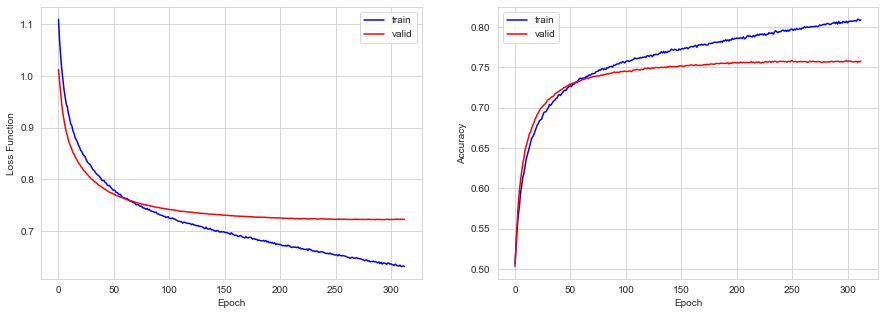

In [25]:
# Print Loss Functions and Accuracy
history(history_resnet50)

##### Predict

In [39]:
# Load Model
resnet50.load_weights('weights_compare_resnet50.hdf5')

In [40]:
# Make Prediction on Test
resnet50_predictions = (resnet50.predict(test_resnet50) >= 0.5).astype(int)

In [42]:
# F1 Score
resnet50_score = f1_score(test_targets, resnet50_predictions)
print('F1 score: %.5f' % resnet50_score)

F1 score: 0.76828


In [34]:
#correct predictions
for i in range(len(test_targets)):
    if np.all(resnet50_predictions[i] == test_targets[i]):
        print(i)

2
10
12
16
28
47
48
51
60
61
64
68
74
79
84
87
94
96
101
103
106
118
120
130
138
151
158
160
170
172
175
178
179
180
188
190
200
204
208
214
216
218
229
232
233
234
247
264
267
272
280
295
299
303
305
307
312
315
318
326
331
345
348
350
352
363
368
377
385
390
407
408
416
422
424
433
439
448
486
503
506
511
513
526
527
540
552
558
562
568
574
578
592
593
599
609
614
617
630
635
640
646
647
650
654
655
662
665
668
670
684
687
692
704
711
716
719
722
723
726
729
741
743
748
752
753
763
769
774
779
786
787
789
793
801
803
809
827
838
839
841
844
845
849
850
855
860
861
862
868
878
893
896
898
903
906
910
917
918
923
925
935
949
951
953
955
972
977
983
993
998
1011
1013
1017
1020
1029
1032
1043
1052
1053
1060
1073
1084
1085
1089
1107
1109
1122
1126
1141
1142
1144
1145
1148
1154
1156
1157
1162
1165
1172
1176
1183
1189
1199
1200
1203
1208
1213
1215
1216
1223
1237
1249
1255
1258
1259
1260
1261
1275
1291
1300
1301
1303
1307
1325
1332
1334
1350
1363
1365
1366
1367
1370
1376
1378
1383
1398
1403


In [83]:
#bad predictions
for i in range(len(test_targets)):
    if not np.any(resnet50_predictions[i] == test_targets[i]):
        print(i)
        break

428


In [39]:
LABELS = {0: 'good_for_lunch', 1: 'good_for_dinner', 2: 'takes_reservations',  3: 'outdoor_seating', 4: 'restaurant_is_expensive', 
          5: 'has_alcohol', 6: 'has_table_service', 7: 'ambience_is_classy', 8: 'good_for_kids'}

In [40]:
label = pd.DataFrame(LABELS.values(), index=LABELS.keys(), columns=['Label Definition'])
label

,Label Definition
0,good_for_lunch
1,good_for_dinner
2,takes_reservations
3,outdoor_seating
4,restaurant_is_expensive
5,has_alcohol
6,has_table_service
7,ambience_is_classy
8,good_for_kids


In [48]:
def print_label(targets):
    result=[]
    for i in range(len(targets)):
        if targets[i] == 0:
            result.append(LABELS[i])
    return result

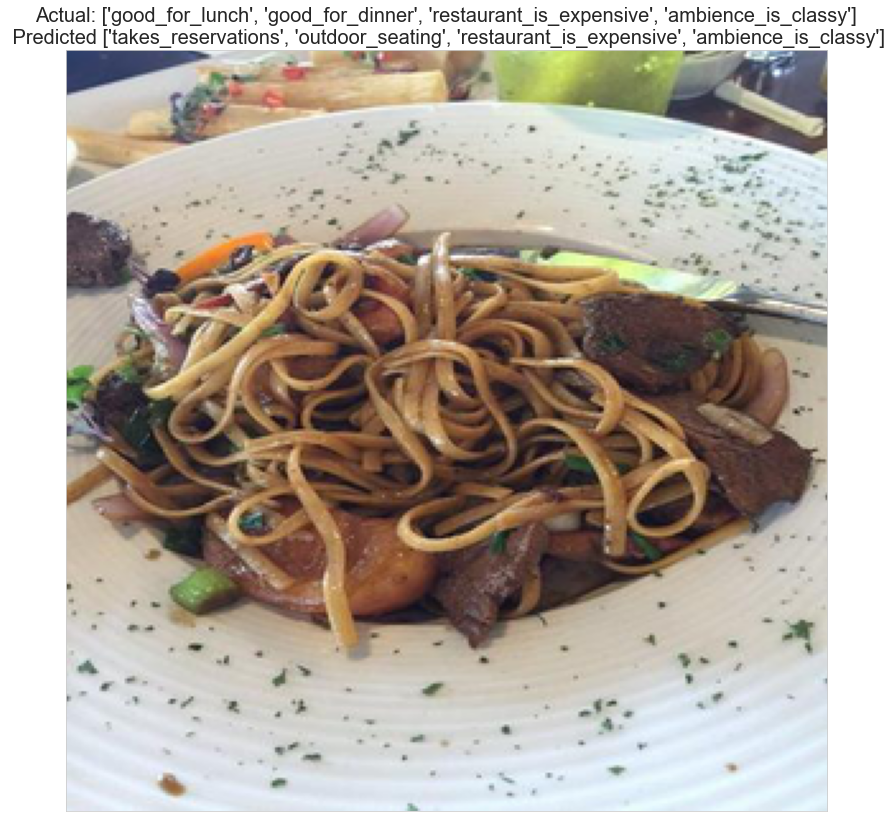

In [66]:
fig = plt.figure(figsize = (18,14))
img = Image.open(train_files[0])
img = img.resize((299, 299), Image.ANTIALIAS)
ax = fig.add_subplot(1, 1, 1, xticks = [], yticks = [])
ax.set_title('Actual: ' + str(print_label(resnet50_predictions[0])) + '\n Predicted ' + str(print_label(test_targets[0])), size=20)
ax.imshow(img)

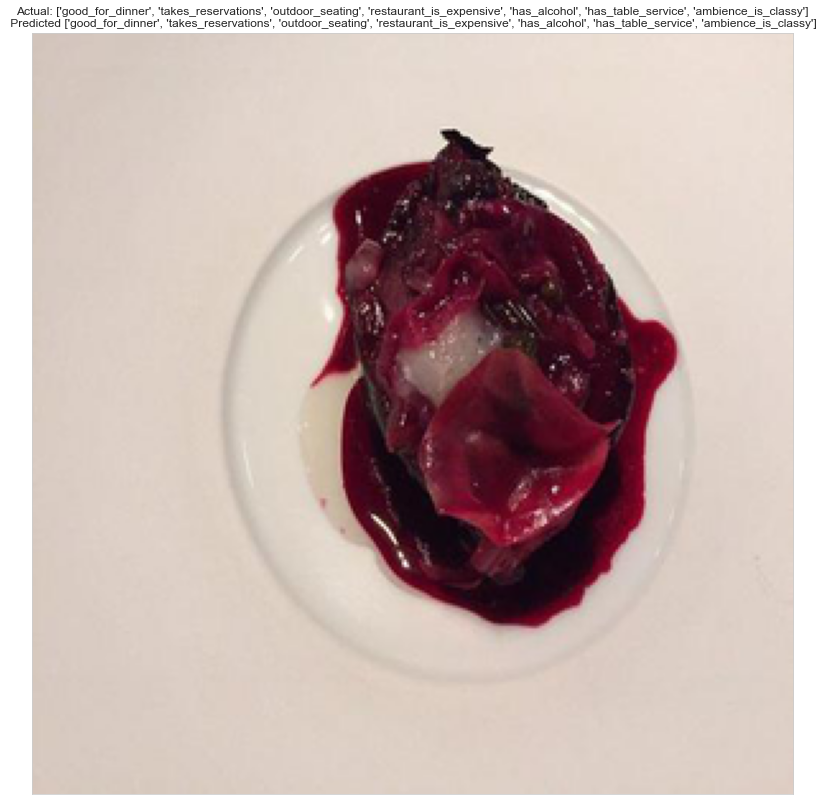

In [100]:
fig = plt.figure(figsize = (18,14))
img = Image.open(train_files[10])
img = img.resize((299, 299), Image.ANTIALIAS)
ax = fig.add_subplot(1, 1, 1, xticks = [], yticks = [])
ax.set_title('Actual: ' + str(print_label(resnet50_predictions[10])) + '\n Predicted ' + str(print_label(test_targets[10])), size=12)
ax.imshow(img)

In [89]:
pd.DataFrame({'Actual Label':print_label(test_targets[10]), 'Predicted Label':print_label(resnet50_predictions[10])})

,Actual Label,Predicted Label
0,good_for_dinner,good_for_dinner
1,takes_reservations,takes_reservations
2,outdoor_seating,outdoor_seating
3,restaurant_is_expensive,restaurant_is_expensive
4,has_alcohol,has_alcohol
5,has_table_service,has_table_service
6,ambience_is_classy,ambience_is_classy


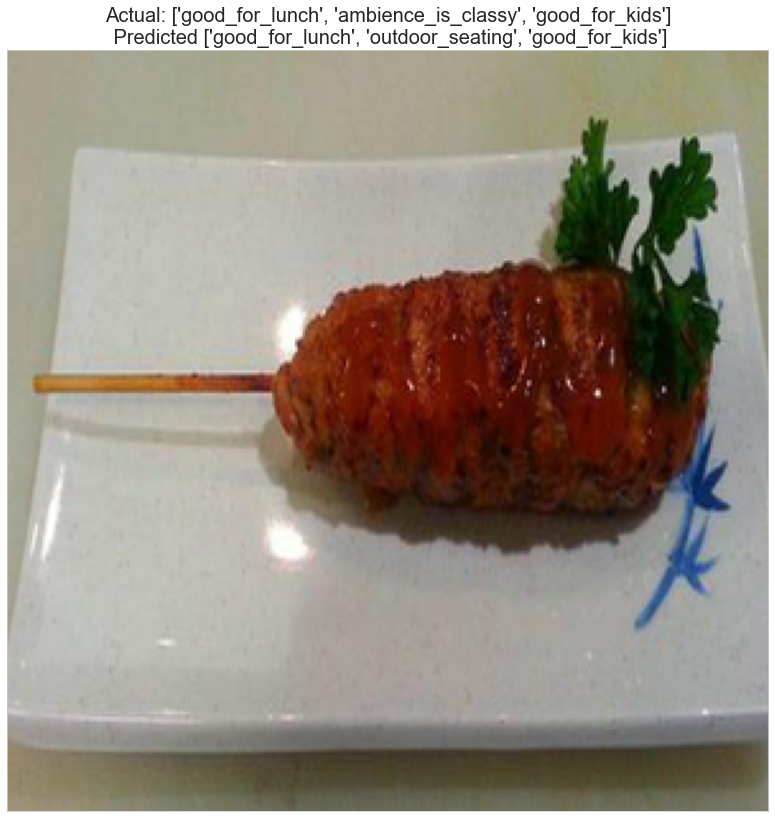

In [94]:
fig = plt.figure(figsize = (18,14))
img = Image.open(train_files[1])
img = img.resize((299, 299), Image.ANTIALIAS)
ax = fig.add_subplot(1, 1, 1, xticks = [], yticks = [])
ax.set_title('Actual: ' + str(print_label(test_targets[1])) + '\n Predicted ' + str(print_label(resnet50_predictions[1])), size=20)
ax.imshow(img)

In [90]:
pd.DataFrame({'Actual Label':print_label(test_targets[1]), 'Predicted Label':print_label(resnet50_predictions[1])})

,Actual Label,Predicted Label
0,good_for_lunch,good_for_lunch
1,ambience_is_classy,outdoor_seating
2,good_for_kids,good_for_kids


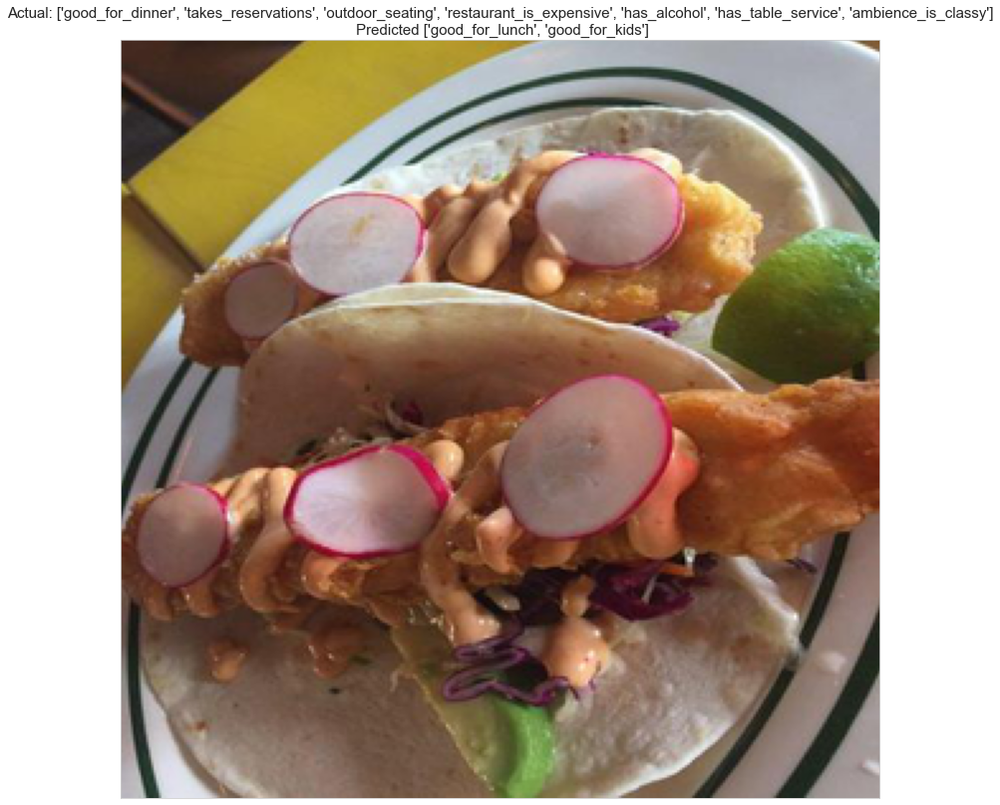

In [95]:
fig = plt.figure(figsize = (18,14))
img = Image.open(train_files[428])
img = img.resize((299, 299), Image.ANTIALIAS)
ax = fig.add_subplot(1, 1, 1, xticks = [], yticks = [])
ax.set_title('Actual: ' + str(print_label(test_targets[428])) + '\n Predicted ' + str(print_label(resnet50_predictions[428])), size=15)
ax.imshow(img)

In [96]:
a = print_label(resnet50_predictions[428])
a.extend(['NA', 'NA', 'NA', 'NA', 'NA'])

In [97]:
pd.DataFrame({'Actual Label':print_label(test_targets[428]), 'Predicted Label':a})

,Actual Label,Predicted Label
0,good_for_dinner,good_for_lunch
1,takes_reservations,good_for_kids
2,outdoor_seating,NA
3,restaurant_is_expensive,NA
4,has_alcohol,NA
5,has_table_service,NA
6,ambience_is_classy,NA


#### InceptionV3

In [43]:
from keras.applications.inception_v3 import preprocess_input

train_tensors = preprocess_input(paths_to_tensor(train_files[:nb_train]))
valid_tensors = preprocess_input(paths_to_tensor(valid_files[:nb_valid]))
test_tensors = preprocess_input(paths_to_tensor(test_files[:nb_test]))

100%|██████████████████████████████████████| 2000/2000 [00:04<00:00, 401.06it/s]


In [44]:
from keras.applications.inception_v3 import InceptionV3

model = InceptionV3(include_top=False)
model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d (Conv2D)                (None, None, None,   864         ['input_2[0][0]']                
                                32)                                                               
                                                                                                  
 batch_normalization_3 (BatchNo  (None, None, None,   96         ['conv2d[0][0]']                 
 rmalization)                   32)                                                    

                                                                                                  
 average_pooling2d (AveragePool  (None, None, None,   0          ['max_pooling2d_1[0][0]']        
 ing2D)                         192)                                                              
                                                                                                  
 conv2d_5 (Conv2D)              (None, None, None,   12288       ['max_pooling2d_1[0][0]']        
                                64)                                                               
                                                                                                  
 conv2d_7 (Conv2D)              (None, None, None,   76800       ['activation_6[0][0]']           
                                64)                                                               
                                                                                                  
 conv2d_10

                                                                                                  
 conv2d_18 (Conv2D)             (None, None, None,   16384       ['average_pooling2d_1[0][0]']    
                                64)                                                               
                                                                                                  
 batch_normalization_15 (BatchN  (None, None, None,   192        ['conv2d_12[0][0]']              
 ormalization)                  64)                                                               
                                                                                                  
 batch_normalization_17 (BatchN  (None, None, None,   192        ['conv2d_14[0][0]']              
 ormalization)                  64)                                                               
                                                                                                  
 batch_nor

                                                                                                  
 batch_normalization_28 (BatchN  (None, None, None,   192        ['conv2d_25[0][0]']              
 ormalization)                  64)                                                               
                                                                                                  
 activation_19 (Activation)     (None, None, None,   0           ['batch_normalization_22[0][0]'] 
                                64)                                                               
                                                                                                  
 activation_21 (Activation)     (None, None, None,   0           ['batch_normalization_24[0][0]'] 
                                64)                                                               
                                                                                                  
 activatio

                                128)                                                              
                                                                                                  
 conv2d_36 (Conv2D)             (None, None, None,   114688      ['activation_35[0][0]']          
                                128)                                                              
                                                                                                  
 batch_normalization_34 (BatchN  (None, None, None,   384        ['conv2d_31[0][0]']              
 ormalization)                  128)                                                              
                                                                                                  
 batch_normalization_39 (BatchN  (None, None, None,   384        ['conv2d_36[0][0]']              
 ormalization)                  128)                                                              
          

 ormalization)                  160)                                                              
                                                                                                  
 activation_44 (Activation)     (None, None, None,   0           ['batch_normalization_47[0][0]'] 
                                160)                                                              
                                                                                                  
 conv2d_45 (Conv2D)             (None, None, None,   179200      ['activation_44[0][0]']          
                                160)                                                              
                                                                                                  
 batch_normalization_48 (BatchN  (None, None, None,   480        ['conv2d_45[0][0]']              
 ormalization)                  160)                                                              
          

 activation_48 (Activation)     (None, None, None,   0           ['batch_normalization_51[0][0]'] 
                                192)                                                              
                                                                                                  
 activation_49 (Activation)     (None, None, None,   0           ['batch_normalization_52[0][0]'] 
                                192)                                                              
                                                                                                  
 mixed5 (Concatenate)           (None, None, None,   0           ['activation_40[0][0]',          
                                768)                              'activation_43[0][0]',          
                                                                  'activation_48[0][0]',          
                                                                  'activation_49[0][0]']          
          

 batch_normalization_56 (BatchN  (None, None, None,   576        ['conv2d_53[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 batch_normalization_61 (BatchN  (None, None, None,   576        ['conv2d_58[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 batch_normalization_62 (BatchN  (None, None, None,   576        ['conv2d_59[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 activation_50 (Activation)     (None, None, None,   0           ['batch_normalization_53[0][0]'] 
          

 conv2d_60 (Conv2D)             (None, None, None,   147456      ['mixed6[0][0]']                 
                                192)                                                              
                                                                                                  
 conv2d_63 (Conv2D)             (None, None, None,   258048      ['activation_62[0][0]']          
                                192)                                                              
                                                                                                  
 conv2d_68 (Conv2D)             (None, None, None,   258048      ['activation_67[0][0]']          
                                192)                                                              
                                                                                                  
 conv2d_69 (Conv2D)             (None, None, None,   147456      ['average_pooling2d_6[0][0]']    
          

 batch_normalization_74 (BatchN  (None, None, None,   960        ['conv2d_71[0][0]']              
 ormalization)                  320)                                                              
                                                                                                  
 batch_normalization_78 (BatchN  (None, None, None,   576        ['conv2d_75[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 activation_71 (Activation)     (None, None, None,   0           ['batch_normalization_74[0][0]'] 
                                320)                                                              
                                                                                                  
 activation_75 (Activation)     (None, None, None,   0           ['batch_normalization_78[0][0]'] 
          

                                384)                                                              
                                                                                                  
 activation_79 (Activation)     (None, None, None,   0           ['batch_normalization_82[0][0]'] 
                                384)                                                              
                                                                                                  
 activation_82 (Activation)     (None, None, None,   0           ['batch_normalization_85[0][0]'] 
                                384)                                                              
                                                                                                  
 activation_83 (Activation)     (None, None, None,   0           ['batch_normalization_86[0][0]'] 
                                384)                                                              
          

 ormalization)                  384)                                                              
                                                                                                  
 batch_normalization_95 (BatchN  (None, None, None,   1152       ['conv2d_92[0][0]']              
 ormalization)                  384)                                                              
                                                                                                  
 conv2d_93 (Conv2D)             (None, None, None,   393216      ['average_pooling2d_8[0][0]']    
                                192)                                                              
                                                                                                  
 batch_normalization_88 (BatchN  (None, None, None,   960        ['conv2d_85[0][0]']              
 ormalization)                  320)                                                              
          

In [45]:
train_inception = model.predict(train_tensors)
valid_inception = model.predict(valid_tensors)
test_inception  = model.predict(test_tensors)

In [46]:
print(train_inception.shape)

(20000, 5, 5, 2048)


In [47]:
np.savez('yelp_inception.npz', 
         train_features=train_inception, train_targets=train_targets[:nb_train],
         valid_features=valid_inception, valid_targets=valid_targets[:nb_valid],
         test_features=test_inception, test_targets=test_targets[:nb_test])

In [48]:
bottleneck_features = np.load('yelp_inception.npz')
train_inception = bottleneck_features['train_features']
valid_inception = bottleneck_features['valid_features']
test_inception = bottleneck_features['test_features']

train_targets = bottleneck_features['train_targets']
valid_targets = bottleneck_features['valid_targets']
test_targets = bottleneck_features['test_targets']

In [65]:
inception = Sequential()
inception.add(GlobalAveragePooling2D(input_shape=train_inception.shape[1:]))

inception.add(Dense(1024, activation='relu', kernel_regularizer=l2(1e-4),
                                             bias_regularizer=l2(1e-4),
                                             activity_regularizer=l2(1e-5)))
inception.add(BatchNormalization())
inception.add(Dropout(0.3))

inception.add(Dense(512, activation='relu', kernel_regularizer=l2(1e-4),
                                             bias_regularizer=l2(1e-4),
                                             activity_regularizer=l2(1e-5)))
inception.add(BatchNormalization())
inception.add(Dropout(0.3))

inception.add(Dense(256, activation='relu', kernel_regularizer=l2(1e-4),
                                             bias_regularizer=l2(1e-4),
                                             activity_regularizer=l2(1e-5)))
inception.add(BatchNormalization())
inception.add(Dropout(0.3))

inception.add(Dense(128, activation='relu', kernel_regularizer=l2(1e-4),
                                             bias_regularizer=l2(1e-4),
                                             activity_regularizer=l2(1e-5)))
inception.add(BatchNormalization())
inception.add(Dropout(0.3))

inception.add(Dense(9, activation='sigmoid'))

inception.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 global_average_pooling2d_3   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_16 (Dense)            (None, 1024)              2098176   
                                                                 
 batch_normalization_107 (Ba  (None, 1024)             4096      
 tchNormalization)                                               
                                                                 
 dropout_2 (Dropout)         (None, 1024)              0         
                                                                 
 dense_17 (Dense)            (None, 512)               524800    
                                                                 
 batch_normalization_108 (Ba  (None, 512)             

In [66]:
rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.0001, momentum=0.9, epsilon=1e-06)
sgd = SGD(lr=0.0001, decay=1e-6, momentum=0.9, nesterov=True)
inception.compile(loss='binary_crossentropy', optimizer=rmsprop, metrics=['binary_accuracy'])
checkpointer = ModelCheckpoint(filepath='weights_compare_inception.hdf5', save_best_only=True)
checkimprovement = EarlyStopping(monitor='val_binary_accuracy', min_delta=0, patience=20)

history_inception = inception.fit(train_inception, train_targets, 
                                validation_data=(valid_inception,valid_targets), 
                                epochs=1000, batch_size=128,
                                callbacks=[checkpointer,checkimprovement]
                               )

Epoch 1/1000
157/157 [==============================] - 3s 17ms/step - loss: 0.9654 - binary_accuracy: 0.6427 - val_loss: 0.8108 - val_binary_accuracy: 0.7182
Epoch 2/1000
157/157 [==============================] - 2s 15ms/step - loss: 0.8247 - binary_accuracy: 0.7100 - val_loss: 0.8163 - val_binary_accuracy: 0.7129
Epoch 3/1000
157/157 [==============================] - 2s 15ms/step - loss: 0.7836 - binary_accuracy: 0.7246 - val_loss: 0.7801 - val_binary_accuracy: 0.7174
Epoch 4/1000
157/157 [==============================] - 2s 15ms/step - loss: 0.7576 - binary_accuracy: 0.7318 - val_loss: 0.7543 - val_binary_accuracy: 0.7296
Epoch 5/1000
157/157 [==============================] - 2s 15ms/step - loss: 0.7390 - binary_accuracy: 0.7371 - val_loss: 0.7358 - val_binary_accuracy: 0.7341
Epoch 6/1000
157/157 [==============================] - 2s 15ms/step - loss: 0.7235 - binary_accuracy: 0.7394 - val_loss: 0.7560 - val_binary_accuracy: 0.7206
Epoch 7/1000
157/157 [========================

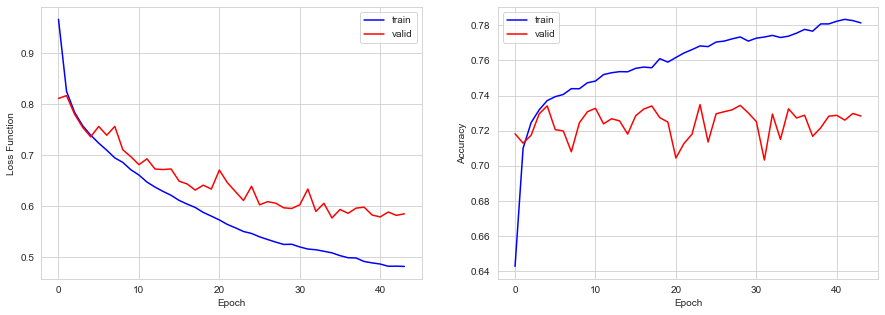

In [67]:
history(history_inception)

In [68]:
inception.load_weights('weights_compare_inception.hdf5')

In [69]:
inception_predictions = (inception.predict(test_inception) >= 0.5).astype(int)

In [70]:
inception_score = f1_score(test_targets, inception_predictions)
print('F1 score: %.5f' % inception_score)

F1 score: 0.73818
